<a href="https://colab.research.google.com/github/rohitgupta29/AI7-/blob/master/Covid_updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [65]:
# !pip install folium
# !pip install plotly

In [66]:
#imports
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import os

import folium

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

import math
import random
from datetime import timedelta, datetime, date


import warnings
warnings.filterwarnings('ignore')
#color pallette

cnf = '#393e46'
dth = '#ff2e63'
rec = '#21bf73'
act = '#fe9801'


import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

Dataset Preparation

In [67]:
import plotly as py
py.offline.init_notebook_mode(connected = True)

In [68]:
!git clone https://github.com/laxmimerit/Covid-19-Preprocessed-Dataset.git

fatal: destination path 'Covid-19-Preprocessed-Dataset' already exists and is not an empty directory.


In [69]:
path1 = "https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/country_daywise.csv"

path2 = "https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/countrywise.csv"

path3 = "https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/covid_19_data_cleaned.csv"

path4 = "https://raw.githubusercontent.com/laxmimerit/Covid-19-Preprocessed-Dataset/master/preprocessed/daywise.csv"




In [70]:
df = pd.read_csv(path3, parse_dates = ['Date']) 
country_daywise = pd.read_csv(path1, parse_dates = ['Date'])
countrywise = pd.read_csv(path2)
daywise = pd.read_csv(path4, parse_dates = ['Date'])



In [71]:
df['Province/State'] = df['Province/State'].fillna("")

df.head()

,Date,Province/State,Country,Lat,Long,Confirmed,Recovered,Deaths,Active
0,2020-01-22,,Afghanistan,33.93911,67.709953,0,0,0,0
1,2020-01-23,,Afghanistan,33.93911,67.709953,0,0,0,0
2,2020-01-24,,Afghanistan,33.93911,67.709953,0,0,0,0
3,2020-01-25,,Afghanistan,33.93911,67.709953,0,0,0,0
4,2020-01-26,,Afghanistan,33.93911,67.709953,0,0,0,0


In [72]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()

recovered.head()

,Date,Recovered
0,2020-01-22,28
1,2020-01-23,30
2,2020-01-24,36
3,2020-01-25,39
4,2020-01-26,52


In [73]:
df.isnull().sum()

Date              0
Province/State    0
Country           0
Lat               0
Long              0
Confirmed         0
Recovered         0
Deaths            0
Active            0
dtype: int64

In [74]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57120 entries, 0 to 57119
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            57120 non-null  datetime64[ns]
 1   Province/State  57120 non-null  object        
 2   Country         57120 non-null  object        
 3   Lat             57120 non-null  float64       
 4   Long            57120 non-null  float64       
 5   Confirmed       57120 non-null  int64         
 6   Recovered       57120 non-null  int64         
 7   Deaths          57120 non-null  int64         
 8   Active          57120 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 3.9+ MB


In [75]:
df.query('Country == "US"')

,Date,Province/State,Country,Lat,Long,Confirmed,Recovered,Deaths,Active
50820,2020-01-22,,US,40.0,-100.0,1,0,0,1
50821,2020-01-23,,US,40.0,-100.0,1,0,0,1
50822,2020-01-24,,US,40.0,-100.0,2,0,0,2
50823,2020-01-25,,US,40.0,-100.0,2,0,0,2
50824,2020-01-26,,US,40.0,-100.0,5,0,0,5
...,...,...,...,...,...,...,...,...,...
51025,2020-08-14,,US,40.0,-100.0,5313252,1796326,168452,3348474
51026,2020-08-15,,US,40.0,-100.0,5361165,1818527,169481,3373157
51027,2020-08-16,,US,40.0,-100.0,5403213,1833067,170052,3400094
51028,2020-08-17,,US,40.0,-100.0,5438325,1865580,170497,3402248


WOrldwide Total Confirmed, Recovered, and Deaths

In [76]:
confirmed.tail()

,Date,Confirmed
205,2020-08-14,21211573
206,2020-08-15,21459699
207,2020-08-16,21672186
208,2020-08-17,21881858
209,2020-08-18,22136954


In [77]:
recovered.tail()

,Date,Recovered
205,2020-08-14,13276831
206,2020-08-15,13445842
207,2020-08-16,13676868
208,2020-08-17,13888301
209,2020-08-18,14116451


In [78]:
deaths.tail()

,Date,Deaths
205,2020-08-14,760374
206,2020-08-15,765718
207,2020-08-16,769904
208,2020-08-17,774034
209,2020-08-18,780908


In [79]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = confirmed['Date'], y = confirmed['Confirmed'], mode = 'lines + markers',name = 'Confirmed', line = dict(color = "Orange", width =2 )))

fig.add_trace(go.Scatter(x = confirmed['Date'], y = recovered['Recovered'], mode = 'lines + markers',name = 'Recovered', line = dict(color = "Green", width =2 )))

fig.add_trace(go.Scatter(x = confirmed['Date'], y = deaths['Deaths'], mode = 'lines + markers',name = 'Confirmed', line = dict(color = "Yellow", width =2 )))

fig.update_layout(title = 'Worldwide Covid-19 Cases', xaxis_tickfont_size = 14, yaxis = dict(title = 'Number of cases'))

fig.show()

CAses Density Animation on World Map

In [80]:
df['Date'] = df['Date'].astype(str)

In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57120 entries, 0 to 57119
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Date            57120 non-null  object 
 1   Province/State  57120 non-null  object 
 2   Country         57120 non-null  object 
 3   Lat             57120 non-null  float64
 4   Long            57120 non-null  float64
 5   Confirmed       57120 non-null  int64  
 6   Recovered       57120 non-null  int64  
 7   Deaths          57120 non-null  int64  
 8   Active          57120 non-null  int64  
dtypes: float64(2), int64(4), object(3)
memory usage: 3.9+ MB


In [82]:
fig = px.density_mapbox(df, lat = 'Lat', lon = 'Long', hover_name = 'Country', hover_data = ['Confirmed','Recovered','Deaths'], animation_frame = 'Date',color_continuous_scale = 'Portland',radius = 7, zoom = 0,height = 700 )
fig.update_layout(title = 'Worldwide Covid-19 Cases with Time Laps')
fig.update_layout(mapbox_style = 'open-street-map', mapbox_center_lon = 0)

fig.show()

Total Cases on Ships

In [83]:
df['Date'] = pd.to_datetime(df['Date'])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 57120 entries, 0 to 57119
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            57120 non-null  datetime64[ns]
 1   Province/State  57120 non-null  object        
 2   Country         57120 non-null  object        
 3   Lat             57120 non-null  float64       
 4   Long            57120 non-null  float64       
 5   Confirmed       57120 non-null  int64         
 6   Recovered       57120 non-null  int64         
 7   Deaths          57120 non-null  int64         
 8   Active          57120 non-null  int64         
dtypes: datetime64[ns](1), float64(2), int64(4), object(2)
memory usage: 3.9+ MB


In [84]:
#Ships
#================

ship_rows = df['Province/State'].str.contains('Grand Princess') | df['Province/State'].str.contains('Diamond Princess') | df['Country'].str.contains('MS Zaandam')
ship = df[ship_rows]

#df = df[~ship_rows]      #~ effects the boolian value here

In [85]:
ship_latest = ship[ship['Date'] == max(ship['Date'])]
ship_latest

,Date,Province/State,Country,Lat,Long,Confirmed,Recovered,Deaths,Active
8819,2020-08-18,Diamond Princess,Canada,0.0,0.0,0,0,1,-1
9029,2020-08-18,Grand Princess,Canada,0.0,0.0,13,0,0,13
35489,2020-08-18,,MS Zaandam,0.0,0.0,9,0,2,7


In [86]:
ship_latest.style.background_gradient(cmap = 'Pastel1_r')

,Date,Province/State,Country,Lat,Long,Confirmed,Recovered,Deaths,Active
8819,2020-08-18 00:00:00,Diamond Princess,Canada,0.000000,0.000000,0,0,1,-1
9029,2020-08-18 00:00:00,Grand Princess,Canada,0.000000,0.000000,13,0,0,13
35489,2020-08-18 00:00:00,,MS Zaandam,0.000000,0.000000,9,0,2,7


Cases Over the Time with Area Plot

In [87]:
temp = df.groupby('Date')['Confirmed','Deaths','Recovered','Active'].sum().reset_index()
temp = temp[temp['Date'] ==max(temp['Date'])].reset_index(drop = True)

In [88]:
temp.tail(1)

,Date,Confirmed,Deaths,Recovered,Active
0,2020-08-18,22136954,780908,14116451,7239595


In [89]:
tm = temp.melt(id_vars = 'Date',value_vars = ['Active','Deaths','Recovered'])

fig = px.treemap(tm, path = ['variable'] , values = 'value', height = 250,width = 800, color_disrete_sequence = [act,rec,dth])

fig.data[0].textinfo = 'label + text + value'

fig.show()
#57 min

TypeError: ignored

In [ ]:
temp = df.groupby('Date')['Recovered','Active','Deaths'].sum().reset_index()
temp = temp.melt(id_vars = 'Date',value_vars = ['Recovered','Deaths','Active'], var_name = 'Case', value_name = 'Count')
temp

fig = px.area(temp, x = 'Date', y = 'Count', color = 'Case', height = 600, title = 'Cases over time',color_discrete_sequence = [rec, dth, act])

fig.update_layout(xaxis_rangeslider_visible = True)

fig.show()

In [ ]:
# Worldwide Cases on Folium Maps

In [ ]:
temp = df[df['Date'] == max(df['Date'])]
temp

m = folium.Map(location= [0,0], tiles= 'cartodbpositron', min_zoom = 1, max_zoom = 4, zoom_start = 1)

for i in range(0,len(temp)):
  folium.Circle(location = [temp.iloc[i]['Lat'], temp.iloc[i]['Long']],color = 'crimson', fill = 'crimson',
                tooltips = '<li><bold> Country: ' + str(temp.iloc[i]['Country']) +
                '<li><bold> Province: ' + str(temp.iloc[i]['Province/State'])
                + '<li><bold> Confirmed: ' + str(temp.iloc[i]['Confirmed'])
                + '<li><bold> Deaths: ' + str(temp.iloc[i]['Deaths']),
                radius = int(temp.iloc[i]['Confirmed'])** 0.5).add_to(m)
                

Confirmed Cases With Choropleth Map

In [ ]:
country_daywise.head()

In [ ]:
fig = px.choropleth(country_daywise,locations = 'Country',locationmode = 'country names',color = np.log(country_daywise['Confirmed']),
        hover_name = 'Country', animation_frame = country_daywise['Date'].dt.strftime('%Y-%m-%d'), 
        title = 'Cases over time', color_continuous_scale = px.colors.sequential.Inferno)

fig.update(layout_coloraxis_showscale = True)

fig.show()

Deaths and Recoveries per 100 Cases

In [ ]:
daywise.head()

In [ ]:
fig_c = px.bar(daywise, x = 'Date', y = 'Confirmed', color_discrete_sequence = [act])
fig_d = px.bar(daywise, x = 'Date', y = 'Deaths', color_discrete_sequence = [dth])

fig = make_subplots(rows = 1, cols = 2, shared_xaxes = False, horizontal_spacing = 0.1,
                    subplot_titles = ('COnfirmed Cases', 'Death Cases'))

fig.add_trace(fig_c['data'][0], row = 1, col = 1)

fig.add_trace(fig_d['data'][0], row =1, col =2)

fig.update_layout(height = 400)

fig.show()

Confirmed and Death Cases with Static Colormap

In [ ]:
fig_c = px.choropleth(countrywise, locations = 'Country', locationmode = 'country names',color = np.log(countrywise['Confirmed']), hover_name = 'Country',
                      hover_data = ['Confirmed'])
temp = countrywise[countrywise['Deaths']> 0]
fig_d = px.choropleth(temp, locations = 'Country', locationmode = 'country names',
              color = np.log(temp['Deaths']), hover_name = 'Country',
              hover_data = ['Deaths'])


fig = make_subplots(rows = 1, cols = 2, subplot_titles = ['Confirmed', 'Deaths'],
                    specs = [[{'type': 'choropleth'},{'type':'choropleth'}]])

fig.add_trace(fig_c['data'][0],row =1, col = 1)
fig.add_trace(fig_c['data'][0],row =1, col = 2)

fig.update(layout_coloraxis_showscale = False)
fig.show()



In [ ]:
daywise.columns

In [ ]:
fig1 = px.line(daywise, x = 'Date', y = 'Deaths / 100 Cases', color_discrete_sequence = [dth])

fig2 = px.line(daywise, x = 'Date', y = 'Recovered / 100 Cases', color_discrete_sequence = [rec])
fig3 = px.line(daywise, x = 'Date', y = 'Deaths / 100 Recovered', color_discrete_sequence = [rec])

fig = make_subplots(rows = 1, cols = 3, shared_xaxes = False, 
                   subplot_titles = ('Deaths / 100 Cases','Recovered / 100 Cases', 'Deaths/ 100 Recovered'))

fig.add_trace(fig1['data'][0],row =1, col =1)
fig.add_trace(fig1['data'][0],row =1, col =2)
fig.add_trace(fig1['data'][0],row =1, col =3)

fig.update_layout(height = 400)

fig.show()


New Cases and No. of Countries

In [ ]:
fig_c = px.bar(daywise, x = 'Date', y = 'Confirmed', color_discrete_sequence = [act])
fig_d = px.bar(daywise, x = 'Date',y = 'No. of Countries', color_discrete_sequence = [dth])

fig = make_subplots(rows = 1, cols = 2, shared_xaxes = False, horizontal_spacing = 0.1,
                    subplot_titles = ('No. of New Cases per Day', 'No. of Countries'))

fig.add_trace(fig_c['data'][0], row = 1, col =1)

fig.add_trace(fig_c['data'][0], row = 1, col =2)

fig.show()

In [ ]:
Top 15 Countries Case Analysis

Top 15 Countries Case Analysis

In [ ]:
countrywise.columns

In [ ]:
top = 15

fig_c = px.bar(countrywise.sort_values('Confirmed').tail(top), x = 'Confirmed', y = 'Country',
               text = 'Confirmed', orientation = 'h', color_discrete_sequence = [act])
fig_d = px.bar(countrywise.sort_values('Deaths').tail(top), x = 'Deaths', y = 'Country',
               text = 'Deaths', orientation = 'h', color_discrete_sequence = [dth])


fig_a = px.bar(countrywise.sort_values('Active').tail(top), x = 'Active', y = 'Country',
               text = 'Active', orientation = 'h', color_discrete_sequence = ['#434343'])
fig_r = px.bar(countrywise.sort_values('Recovered').tail(top), x = 'Recovered', y = 'Country',
               text = 'Recovered', orientation = 'h', color_discrete_sequence = [rec])

#dc = death/100 cases

fig_dc = px.bar(countrywise.sort_values('Deaths / 100 Cases').tail(top), x = 'Deaths / 100 Cases', y = 'Country',
               text = 'Deaths / 100 Cases', orientation = 'h', color_discrete_sequence = ['#f84351'])
fig_rc = px.bar(countrywise.sort_values('Recovered / 100 Cases').tail(top), x = 'Recovered / 100 Cases', y = 'Country',
               text = 'Recovered / 100 Cases', orientation = 'h', color_discrete_sequence = ['#a45398'])


fig_nc = px.bar(countrywise.sort_values('New Cases').tail(top), x = 'New Cases', y = 'Country',
               text = 'New Cases', orientation = 'h', color_discrete_sequence = ['#f84351'])
temp = countrywise[countrywise['Population'] > 1000000]
fig_p = px.bar(temp.sort_values('Cases / Million People').tail(top), x = 'Cases / Million People', y = 'Country',
               text = 'Cases / Million People', orientation = 'h', color_discrete_sequence = ['#a45398'])



fig_wc = px.bar(countrywise.sort_values('1 week change').tail(top), x = '1 week change', y = 'Country',
               text = '1 week change', orientation = 'h', color_discrete_sequence = ['#c84351'])
temp = countrywise[countrywise['Confirmed'] > 100]
fig_wi = px.bar(temp.sort_values('1 week % increase').tail(top), x = '1 week % increase', y = 'Country',
               text = '1 week % increase', orientation = 'h', color_discrete_sequence = ['#a45398'])


fig = make_subplots(rows = 5, cols = 2, shared_xaxes = False, horizontal_spacing = 0.2, 
                    vertical_spacing = .05, subplot_titles = ('Confirmed Cases', 'Deaths Reported','Recovered Cases', 'Active Cases',
                                                              'Deaths / 100 Cases','Recovered / 100 Cases'
                        , 'New Cases', 'Cases / Million People','1 week change', '1 week % increase'     ))


fig.add_trace(fig_c['data'][0], row = 1, col = 1)
fig.add_trace(fig_d['data'][0], row = 1, col = 2)

fig.add_trace(fig_r['data'][0], row = 2, col = 1)
fig.add_trace(fig_a['data'][0], row = 2, col = 2)


fig.add_trace(fig_dc['data'][0], row = 3, col = 1)
fig.add_trace(fig_rc['data'][0], row = 3, col = 2)

fig.add_trace(fig_dc['data'][0], row = 4, col = 1)
fig.add_trace(fig_rc['data'][0], row = 4, col = 2)


fig.add_trace(fig_wc['data'][0], row = 5, col = 1)
fig.add_trace(fig_wi['data'][0], row = 5, col = 2)




fig.update_layout(height = 3000)
fig.show()

In [ ]:
#install
#conda install -c plotly plotly-orca == 1.2.1 psutil requests

In [ ]:
!conda install -c plotly plotly-ocra == 1.2.1 psutil requests

In [ ]:
if not os.path.exists('images'):
  os.mkdir('images')

In [ ]:
fig.write_image('images/fig.png')

Scatter Plot for Deaths vs Confirmed Cases

In [ ]:
countrywise.sort_values('Deaths', ascending = False).head(15)

In [ ]:
top = 15
fig = px.scatter(countrywise.sort_values('Deaths', ascending = False).head(top),
                 x = 'Confirmed', y = 'Deaths',color = 'Country', size = 'Confirmed',
                 height = 700, text = 'Country', log_x = True, title = 'Deaths vs Confirmed Cases(Cases on log 10)')
fig.update_traces(textposition = 'top center')

fig.update_layout(showlegend = False)

fig.update_layout(xaxis_rangeslider_visible = True)

fig.show()

In [ ]:
countrywise.sort_values('Deaths', ascending = False).head(top)

Confirmed, Deaths, New Cases vs Country and Date

Bar Plot

In [ ]:
fig = px.bar(country_daywise, x = 'Date', y = 'Confirmed', color = 'Country', height = 600,
             title = 'Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [ ]:
fig = px.bar(country_daywise, x = 'Date', y = 'Deaths', color = 'Country', height = 600,
             title = 'Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [ ]:
fig = px.bar(country_daywise, x = 'Date', y = 'Recovered', color = 'Country', height = 600,
             title = 'Recovered', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

In [ ]:
fig = px.bar(country_daywise, x = 'Date', y = 'New Cases', color = 'Country', height = 600,
             title = 'New Cases', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

Line Plot

In [ ]:
fig = px.line(country_daywise, x = 'Date',y = 'Confirmed', color = 'Country',height = 600,
              title = 'Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

fig = px.line(country_daywise, x = 'Date',y = 'Deaths', color = 'Country',height = 600,
              title = 'Deaths', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

fig = px.line(country_daywise, x = 'Date',y = 'Recovered', color = 'Country',height = 600,
              title = 'Recovered', color_discrete_sequence = px.colors.cyclical.mygbm)

fig.show()

Growth Rate after 100 cases in Each Country

In [ ]:
gt_100 = country_daywise[country_daywise['Confirmed'] > 100]['Country'].unique()
temp = df[df['Country'].isin(gt_100)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 100]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_100th_case = pd.merge(temp, min_date, on = 'Country')
from_100th_case['N days'] = (from_100th_case['Date'] - from_100th_case['Min Date']).dt.days


fig = px.line(from_100th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 100 case', height = 600)

fig.show()

In [ ]:
df['Country'].isin(gt_100)

Growth Rate after 1000 cases

In [ ]:
gt_1000 = country_daywise[country_daywise['Confirmed'] > 1000]['Country'].unique()
temp = df[df['Country'].isin(gt_1000)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 1000]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_1000th_case = pd.merge(temp, min_date, on = 'Country')
from_1000th_case['N days'] = (from_1000th_case['Date'] - from_1000th_case['Min Date']).dt.days


fig = px.line(from_1000th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 1000 case', height = 600)

fig.show()

Growth Rate after 10000 cases

In [ ]:
gt_10000 = country_daywise[country_daywise['Confirmed'] > 10000]['Country'].unique()
temp = df[df['Country'].isin(gt_10000)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 10000]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_10000th_case = pd.merge(temp, min_date, on = 'Country')
from_10000th_case['N days'] = (from_10000th_case['Date'] - from_10000th_case['Min Date']).dt.days


fig = px.line(from_10000th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 100 case', height = 600)

fig.show()

Growth rate after 100000 cases

In [ ]:
gt_100000 = country_daywise[country_daywise['Confirmed'] > 100000]['Country'].unique()
temp = df[df['Country'].isin(gt_100000)]
temp = temp.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Confirmed'] > 100000]


min_date = temp.groupby('Country')['Date'].min().reset_index()
min_date.columns = ['Country','Min Date']


from_100000th_case = pd.merge(temp, min_date, on = 'Country')
from_100000th_case['N days'] = (from_100000th_case['Date'] - from_100000th_case['Min Date']).dt.days


fig = px.line(from_100000th_case, x = 'N days', y = 'Confirmed', color = 'Country', 
              title = 'N days from 100000 case', height = 600)

fig.show()

Tree Map Analysis for Confirmed Cases

In [ ]:
full_latest = df[df['Date'] == max(df['Date'])]

fig = px.treemap(full_latest.sort_values(by = 'Confirmed', ascending = False).reset_index(drop = True), 
                 path = ['Country', 'Province/State'], values = 'Confirmed', height = 700,
                 title = 'Number of Confirmed Cases', color_discrete_sequence = px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'

fig.show()

Deaths Cases

In [ ]:
full_latest = df[df['Date'] == max(df['Date'])]

fig = px.treemap(full_latest.sort_values(by = 'Deaths', ascending = False).reset_index(drop = True), 
                 path = ['Country', 'Province/State'], values = 'Deaths', height = 700,
                 title = 'Number of Deaths Cases', color_discrete_sequence = px.colors.qualitative.Dark2)

fig.data[0].textinfo = 'label+text+value'

fig.show()

First and Last Case report Time

In [ ]:
first_date = df[df['Confirmed']>0]
first_date = first_date.groupby('Country')['Date'].agg(['min']).reset_index()

last_date = df.groupby(['Country','Date'])['Confirmed','Deaths','Recovered']
last_date = last_date.sum().diff().reset_index()


mask = (last_date['Country'] != last_date['Country'].shift(1))

last_date.loc[mask, 'Confirmed'] = np.nan
last_date.loc[mask, 'Deaths'] = np.nan
last_date.loc[mask, 'Recovered'] = np.nan

last_date = last_date[last_date['Confirmed'] > 0]
last_date = last_date.groupby('Country')['Date'].agg(['max']).reset_index()


first_last = pd.concat([first_date, last_date['max']], axis = 1)

first_last['max'] = first_last['max'] + timedelta(days = 1)

first_last['Days'] = first_last['max'] - first_last['min']

first_last['Task'] = first_last['Country']

first_last.columns = ['Country', 'Start', 'Finish', 'Days', 'Task']

first_last = first_last.sort_values('Days')

colors = ['#' + ''.join([random.choice('0123456789ABCDEF') for  j in range(6)]) for i in range(len(first_last))]

colors

In [ ]:
fig = ff.create_gantt(first_last, index_col = 'Country', colors = colors, show_colorbar = False,
      bar_width = 0.2, showgrid_x = True, showgrid_y = True, height = 2500)

fig.show()


Confirmed Cases Country and Day wise

In [ ]:
temp = country_daywise.groupby(['Country','Date'])['Confirmed'].sum().reset_index()

temp = temp[temp['Country'].isin(gt_10000)]

countries = temp['Country'].unique()

ncols = 3
nrows = math.ceil(len(countries)/ncols)

fig = make_subplots(rows = nrows, cols = ncols, shared_xaxes = False, subplot_titles = countries)

for ind , country in enumerate (countries):
  row = int ((ind/ncols)+1)
  col = int((ind%ncols)+1)
  fig.add_trace(go.Bar(x = temp['Date'], y = temp.loc[temp['Country'] == country, 'Confirmed'], name = country), row = row, col = col)


fig.update_layout(height = 4000, title_text = 'Confirmed Cases in Each Country')

fig.update_layout(showlegend = False)
fig.show()

COVID-19 vs Other Similar Epidemics

In [ ]:
#from Wikipedia
epidemics = pd.DataFrame({
    'epidemic': ['Covid-19', 'SARS','EBOLA','MERS','H1N1'],
    'start_year': [2019,2002,2013,2012,2009],
    'end_year': [2020,2004,2016,2020,2010],
    'confirmed': [full_latest['Confirmed'].sum(),8422,28646,2519,6724149],
    'deaths': [full_latest['Deaths'].sum(),813,11323,866,19654]
})

epidemics['mortility'] = round((epidemics['deaths']/epidemics['confirmed'])*100,2)

epidemics.head()

In [ ]:
india_age = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/AgeGroupDetails.csv"
india_tests = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/StatewiseTestingDetails.csv"
india_india = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/covid_19_india.csv"
india_hosp = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/HospitalBedsIndia.csv"
india_pop = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/population_india_census2011.csv"
india_labs = "https://raw.githubusercontent.com/rohitgupta29/AI7-/master/ICMRTestingLabs.csv"

In [ ]:
#reading the files
df_age = pd.read_csv(india_age,index_col = 0)
df_india = pd.read_csv(india_india,index_col= 0)
df_tests = pd.read_csv(india_tests)
df_hosp = pd.read_csv(india_hosp,index_col=0)
df_pop = pd.read_csv(india_pop,index_col= 0)
df_labs = pd.read_csv(india_labs)

In [ ]:
#Droping redundant data

df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telangana***'].index, inplace = True)

df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telengana***'].index,inplace = True)

df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Telengana'].index,inplace = True)

df_india.drop(df_india[df_india['State/UnionTerritory'] == 'Unassigned'].index,inplace = True)



In [ ]:
#Some preprocessing

df_india['Date'] = pd.to_datetime(df_india['Date'], dayfirst = True)

df_india['Date'] = df_india['Date'].dt.strftime('%m%d%Y')

#Dropping negative column as we already have 'TotalSample' and 'Positive'

df_tests.drop('Negative', axis = 1, inplace = True)

df_pop.set_index('State / Union Territory', inplace = True)

In [ ]:
#Filling in Missing Data

#For missing 'Positive' cases of COVID, the previous known value is filled in.
df_tests['Positive'].fillna(method = 'ffill', inplace = True)

#For missing 'Sub=District Hospitals' values, assumed 0 hospitals are present in state.

df_hosp.fillna(0,inplace = True)


In [ ]:
#making a database of cases of every state for the last day of reporting

state_report = df_india.groupby(by = 'State/UnionTerritory').max().reset_index()

state_report['Active'] = (state_report['Confirmed'] - (state_report['Cured'] + state_report['Deaths']))

state_report['Deaths per 100 Cases'] = round(((state_report['Deaths']/state_report['Confirmed'])*100),2)

state_report.drop(columns = ['Time', 'ConfirmedIndianNational', 'ConfirmedForeignNational'], inplace = True)

state_report.style.background_gradient(cmap = 'Greens', subset = ['Cured'])\
.background_gradient(cmap = 'Reds',subset = ['Deaths'])\
.background_gradient(cmap = 'Blues', subset = ['Confirmed'])\
.background_gradient(cmap = 'Greys', subset = ['Active'])\
.background_gradient(cmap = 'Reds', subset = ['Deaths per 100 Cases']).format('{:.2f}', subset = ['Deaths per 100 Cases'])

Map Visualization

In [ ]:
#State latitudes and longitudes found using geopy

Location_dict = {'Andaman and Nicobar Islands': (10.2188344, 92.5771329),
 'Andhra Pradesh': (15.9240905, 80.1863809),
 'Arunachal Pradesh': (27.6891712, 96.4597226),
 'Assam': (26.4073841, 93.2551303),
 'Bihar': (25.6440845, 85.906508),
 'Chandigarh': (30.7334421, 76.7797143),
 'Chhattisgarh': (21.6637359, 81.8406351),
 'Daman & Diu': (20.42000485, 72.86376290300566),
 'Delhi': (28.6517178, 77.2219388),
 'Goa': (15.3004543, 74.0855134),
 'Gujarat': (22.41540825, 72.03149703699282),
 'Haryana': (29.0, 76.0),
 'Himachal Pradesh': (31.81676015, 77.34932051968858),
 'Jammu and Kashmir': (33.5574473, 75.06152),
 'Jharkhand': (23.4559809, 85.2557301),
 'Karnataka': (14.5203896, 75.7223521),
 'Kerala': (10.3528744, 76.5120396),
 'Ladakh': (33.9456407, 77.6568576),
 'Madhya Pradesh': (23.9699282, 79.39486954625225),
 'Maharashtra': (19.531932, 76.0554568),
 'Manipur': (24.7208818, 93.9229386),
 'Meghalaya': (25.5379432, 91.2999102),
 'Mizoram': (23.2146169, 92.8687612),
 'Nagaland': (26.1630556, 94.5884911),
 'Odisha': (20.5431241, 84.6897321),
 'Puducherry': (11.9340568, 79.8306447),
 'Punjab': (30.9293211, 75.5004841),
 'Rajasthan': (26.8105777, 73.7684549),
 'Sikkim': (27.601029, 88.45413638680145),
 'Tamil Nadu': (10.9094334, 78.3665347),
 'Telangana': (17.8495919, 79.1151663),
 'Telengana': (17.329125, 78.5822228),
 'Tripura': (23.7750823, 91.7025091),
 'Uttar Pradesh': (27.1303344, 80.859666),
 'Uttarakhand': (30.091993549999998, 79.32176659343018),
 'West Bengal': (22.9964948, 87.6855882)}

In [ ]:
map_states = state_report.drop(index=[5,8,9,36],errors = 'ignore')
map_states.reset_index(inplace = True,drop = True)

india_map = folium.Map(location=[21, 78], zoom_start=5, tiles = 'cartodbpositron',min_zoom = 5, max_zoom = 7,control_scale=True)


for i in range(0,len(map_states)):
    state = map_states['State/UnionTerritory'][i]
    cases = map_states['Confirmed'][i]  
    deaths = map_states['Deaths'][i]
    cured = map_states['Cured'][i]
    
    location = Location_dict[state]
    
    folium.Circle([location[0],location[1]],radius = float(cases * 0.8),color = '#10B4AB',fill_color = 'cyan',
                  fill = True, 
                  tooltip = "<h5 style = 'text-align:center;font-weight:bold'>"+state+"</h5>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Confirmed : '+"</b>"+ str(cases)+"</div>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Recovered : '+"</b>"+ str(cured)+"</div>"\
                  + "<div style = 'text-align:center;'>" + "<b>"+'Deaths : '+"</b>"+ str(deaths)+"</div>").add_to(india_map)
    
india_map.save('indiamap.html')
india_map

We can deduce that the worst-struck states of India are the ones with densely packed urban areas, like Mumbai in Maharashtra, Chennai in Tamil Nadu and New Delhi. Let's see how the total national confirmed cases are distributed.

Data Analysis

In [ ]:
state_report['per cent Confirmed'] = (state_report['Confirmed']*100/state_report.sum()['Confirmed'])
pie = state_report.drop(index = state_report.index[state_report['State/UnionTerritory'] == 'Cases being reassigned to states'])

plt.figure(figsize = (20,20))

fig1 = px.pie(data_frame=pie,values = 'Confirmed',
        hover_name='State/UnionTerritory',
        labels = {'State/UnionTerritory':'State ','Confirmed':'Confirmed Cases '},
        hole = 0.65, color = 'Confirmed',
        template = 'ggplot2',
        color_discrete_sequence=  px.colors.sequential.Mint_r,
        title = "State-wise Distribution of Confirmed Covid Cases (as of "+ str(state_report['Date'].max())+")")
        

fig1.update_traces(textposition='inside', textinfo='percent')

#X------------------------------------------------------------------------------------------------------------------------------------------------X

temp = state_report.sort_values(by = 'Confirmed',ascending= False)[0:20]
temp.reset_index(inplace = True,drop = True)

temp.sort_values(by = 'Confirmed',ascending = False)

plt.figure(figsize= (20,15))
fig2 = px.bar(data_frame=temp, x = temp['State/UnionTerritory'], y=temp['Confirmed'],
            color_continuous_scale= px.colors.sequential.Mint, color = 'Confirmed',
            text='Confirmed',template = 'plotly_white',
            labels = {'State/UnionTerritory':'State','Confirmed':'Confirmed Cases '},
            hover_name = 'State/UnionTerritory',
            hover_data = {'Confirmed':True,'State/UnionTerritory':False}, )

fig2.update_layout(title = {
    'text' : 'Top 20 States by Confirmed Cases',
    'y':0.95,
    'x':0.5,
    'xanchor': 'center',
    'yanchor': 'top'},
    xaxis_title = '')

fig2.update_traces(texttemplate = '%{text:.2s}',textposition = 'outside',textfont_size =13)

fig1.show()
fig2.show()

In [ ]:
temp = state_report.sort_values(by = 'Confirmed',ascending= False)[0:20]
temp.reset_index(inplace = True,drop = True)

temp['Percentage'] =round((temp['Cured']/temp['Confirmed'])*100,2)
plt.figure(figsize = (12,8),dpi = 150)

fig1 = px.bar(data_frame=temp, x = temp['State/UnionTerritory'], y=temp['Confirmed'],
            color_continuous_scale= px.colors.sequential.Blues, color = temp['Percentage'],
            text= temp['Percentage'],template = 'ggplot2',
            labels = {'State/UnionTerritory':'State','Confirmed':'Confirmed Cases ','Percentage':'Percentage Cured '},
            hover_data = {'Confirmed':True,'Percentage':True,'State/UnionTerritory':False}, 
            hover_name = 'State/UnionTerritory')

fig1.update_traces(textposition = 'outside',texttemplate = '%{text:.3s}',textfont_size =13)
fig1.update_layout(title = {
    'text':' Percentage of Cured to Confirmed Cases',
    'x':0.5,
})
fig1.show()

In [ ]:
#Converting dtype of columns in df_hosp to integer

def changetoint(column):
    for i,v in enumerate(column):
        n = ''
        n = n.join([x for x in v if x.isdigit()])
        
        return int(n)

df_hosp['NumPrimaryHealthCenters_HMIS'] = df_hosp['NumPrimaryHealthCenters_HMIS'].apply(changetoint)

df_hosp.drop(index = df_hosp.index[df_hosp['State/UT'] == 'All India'],inplace = True)


In [ ]:
#Taking a look at lab data.
sunburst_data = df_labs[['type','state']]
px.sunburst(sunburst_data,path = ['type','state'],color = 'type',
            
           color_discrete_sequence = px.colors.qualitative.Pastel2,height = 750,width = 750,template = 'ggplot2',title='Available Research Facilities in State based on Lab Type')

In [ ]:
# looking at the state medical facilities

top_community_hosp = df_hosp.nlargest(10,'NumCommunityHealthCenters_HMIS')
top_primary_hosp = df_hosp.nlargest(10,'NumPrimaryHealthCenters_HMIS')
top_rural_hosp = df_hosp.nlargest(10,'NumRuralHospitals_NHP18')
total_hosp =  df_hosp.nlargest(10,'TotalPublicHealthFacilities_HMIS')

plt.figure(figsize = (20,10),dpi = 200)
plt.style.use(u'ggplot')

plt.subplot(2,2,1)

sns.barplot(y = top_community_hosp['State/UT'], x = top_community_hosp['NumCommunityHealthCenters_HMIS'],data= df_hosp,
            orient = 'h' , color = '#58A25D')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Community Health Centres',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,2)

sns.barplot(y = top_rural_hosp['State/UT'], x = top_rural_hosp['NumRuralHospitals_NHP18'],data= df_hosp,
            orient = 'h' , color = '#8ABC7C')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Rural Health Facilities',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,3)

sns.barplot(y = top_primary_hosp['State/UT'], x = top_primary_hosp['NumPrimaryHealthCenters_HMIS'],data= df_hosp,
            orient = 'h' , color = '#00AAAA')
plt.xlabel('')
plt.ylabel("")
plt.title('Number of Primary Health Centres',fontsize = 17)
plt.tick_params(labelsize = 13)


plt.subplot(2,2,4)

sns.barplot(y = total_hosp['State/UT'], x = total_hosp['TotalPublicHealthFacilities_HMIS'],data= df_hosp,
            orient = 'h' , color = '#008B8B')

plt.xlabel('')
plt.ylabel("")
plt.title('Total Public Health Facilities',fontsize = 17)
plt.tick_params(labelsize = 13)

plt.suptitle('State-wise Distribution of Health Facilites',fontsize = 25,x = 0.65)
plt.tight_layout(rect=[0, 0.05, 1.2, 0.95])

Tamil Nadu doesn't rank that high when comparing Total Public Health Facilities. Its low mortality rate can be attributed to faster detection of the virus in patients. Despite having a lot of Public and Rural health facilities, Karnataka is still contending to cure patients.

In [ ]:
latest_tests = df_tests.groupby('State').max().sort_values('TotalSamples',ascending = False)[0:20]
latest_tests['Ratio'] = round((latest_tests['Positive']/latest_tests['TotalSamples'])*1000,2)

fig = px.bar(data_frame = latest_tests,
              y  = latest_tests['TotalSamples'],x =  latest_tests['TotalSamples'].index,template = 'ggplot2',text = latest_tests['Ratio'],
              color = latest_tests['Ratio'],color_continuous_scale= px.colors.sequential.Redor,labels = {'x':'State','TotalSamples':'Number of COVID Tests Done',"Ratio":'5Positive Cases for every 1000 tests'},
              height = 600,width  = 1500)

fig.update_layout(title = {
    'text': 'COVID Tests Done vs Positive Cases for Every 1000 tests'
})
fig.update_traces(textposition = 'outside',textfont_size = 13)

Maharashtra,Delhi,Telangana need to increase their testing as >10% of their tests are positive. Our prime weapon against COVID is detection, contact tracing and breaking the chain.

Andhra Pradesh has done well to have a high test rate despite a limited count of health care institutions in state.

 COVID-19 Clinical Trials

In [ ]:
file ="https://raw.githubusercontent.com/rohitgupta29/AI7-/master/COVID%20clinical%20trials.csv"

In [ ]:
trials = pd.read_csv(file)

In [ ]:
trials.columns

In [ ]:
trials.shape

In [ ]:
#Top 10 countries

In [90]:
labels = trials['Phases'].value_counts().drop('Not Applicable').index
values = trials['Phases'].value_counts().drop('Not Applicable').values
fig = go.Figure(data=[go.Pie(labels=labels, values=values, textinfo='label',
                             insidetextorientation='radial')])
fig.show()
#

ValueError: ignored

In [95]:
# text processing libraries
import re
import string
import nltk
from nltk.corpus import stopwords

In [96]:

def clean_text(text):
    '''Make text lowercase, remove text in square brackets,remove links,remove punctuation
    and remove words containing numbers.'''
    text = text.lower()
    text = re.sub('\[.*?\]', '', text)
    text = re.sub('https?://\S+|www\.\S+', '', text)
    text = re.sub('<.*?>+', '', text)
    text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
    text = re.sub('\n', '', text)
    text = re.sub('\w*\d\w*', '', text)
    return text


def text_preprocessing(text):
    """
    Cleaning and parsing the text.

    """
    tokenizer = nltk.tokenize.RegexpTokenizer(r'\w+')
    nopunc = clean_text(text)
    tokenized_text = tokenizer.tokenize(nopunc)
    #remove_stopwords = [w for w in tokenized_text if w not in stopwords.words('english')]
    combined_text = ' '.join(tokenized_text)
    return combined_text

In [97]:
# Applying the cleaning function to the dataset
phase_4_trials = trials[trials['Phases']=='Phase 4']['Title'].apply(str).apply(lambda x: text_preprocessing(x))

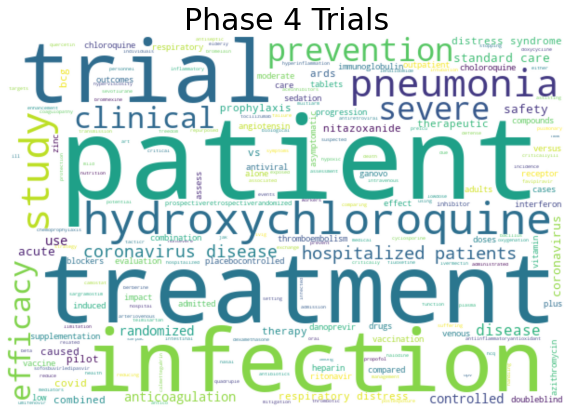

In [98]:
from wordcloud import WordCloud
wordcloud1 = WordCloud( background_color='white',
                        width=600,
                        height=400).generate(" ".join(phase_4_trials))

plt.figure(figsize=(10, 16))
plt.title('Phase 4 Trials',fontsize=30);
plt.imshow(wordcloud1, interpolation="gaussian")
plt.axis("off")
plt.show()